# Youth Tobacco Consumption Analysis - Codebook
## AIT-664-002: Group 9
### By: Prathyusha ELipay, Vedant S. Limbhare, Sai Krishna Nalla

### Libraries Required

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from ipywidgets import interact
from ipykernel.pylab.backend_inline import flush_figures
from matplotlib import colors as mcolors
from sklearn.preprocessing import StandardScaler, LabelEncoder, normalize
from sklearn.decomposition import PCA  
from sklearn.metrics import silhouette_score
from sklearn_extra.cluster import KMedoids
from kneed import KneeLocator
from sklearn.manifold import TSNE
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objs as go
import networkx as nx
from statsmodels.tsa.arima.model import ARIMA
import numpy as np
from statsmodels.tsa.stattools import adfuller

ModuleNotFoundError: No module named 'sklearn_extra'

In [4]:
!pip install folium

### The Dataset

In [6]:
yts = pd.read_csv("D:\DAE\AIT 664\Youth_Tobacco_Survey__YTS__Data_20240209.csv")
yts.head()

,YEAR,LocationAbbr,LocationDesc,TopicType,TopicDesc,MeasureDesc,DataSource,Response,Data_Value_Unit,Data_Value_Type,...,GeoLocation,TopicTypeId,TopicId,MeasureId,StratificationID1,StratificationID2,StratificationID3,StratificationID4,SubMeasureID,DisplayOrder
0,2004,OH,Ohio,Tobacco Use – Survey Data,Cigarette Use (Youth),Smoking Status,YTS,Ever,%,Percentage,...,"(40.060210141, -82.404260056)",BEH,106BEH,166SSA,1GEN,8AGE,6RAC,1EDU,YTS08,8
1,2008,AL,Alabama,Tobacco Use – Survey Data,Cigarette Use (Youth),Smoking Status,YTS,Ever,%,Percentage,...,"(32.840571122, -86.631860762)",BEH,106BEH,166SSA,3GEN,8AGE,6RAC,2EDU,YTS08,8
2,2015,WV,West Virginia,Tobacco Use – Survey Data,Smokeless Tobacco Use (Youth),User Status,YTS,Frequent,%,Percentage,...,"(38.665510202, -80.712640135)",BEH,151BEH,169USS,2GEN,8AGE,6RAC,2EDU,YTS12,12
3,2005,IL,Illinois,Tobacco Use – Survey Data,Cigarette Use (Youth),Smoking Status,YTS,Ever,%,Percentage,...,"(40.485010283, -88.997710178)",BEH,106BEH,166SSA,1GEN,8AGE,6RAC,1EDU,YTS08,8
4,2005,CT,Connecticut,Tobacco Use – Survey Data,Smokeless Tobacco Use (Youth),User Status,YTS,Ever,%,Percentage,...,"(41.56266102, -72.649840952)",BEH,151BEH,169USS,2GEN,8AGE,6RAC,2EDU,YTS11,11


## Data Preprocessing

### Data Cleaning

In [3]:
yts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10600 entries, 0 to 10599
Data columns (total 31 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   YEAR                        10600 non-null  int64  
 1   LocationAbbr                10600 non-null  object 
 2   LocationDesc                10600 non-null  object 
 3   TopicType                   10600 non-null  object 
 4   TopicDesc                   10600 non-null  object 
 5   MeasureDesc                 10600 non-null  object 
 6   DataSource                  10600 non-null  object 
 7   Response                    8190 non-null   object 
 8   Data_Value_Unit             10600 non-null  object 
 9   Data_Value_Type             10600 non-null  object 
 10  Data_Value                  10080 non-null  float64
 11  Data_Value_Footnote_Symbol  517 non-null    object 
 12  Data_Value_Footnote         517 non-null    object 
 13  Data_Value_Std_Err          100

**Remove unwanted columns**

In [4]:
columns_to_remove = ['TopicType', 'DataSource', 'Data_Value_Unit', 'Data_Value_Type', 'Data_Value_Footnote_Symbol', 'Race', 
                     'Age', 'TopicTypeId', 'StratificationID1', 'StratificationID2', 'StratificationID3', 'StratificationID4', 
                     'SubMeasureID', 'TopicId', 'MeasureId', 'DisplayOrder']

yts_ur = yts.drop(columns=columns_to_remove)

print(yts_ur.head())

   YEAR LocationAbbr   LocationDesc                      TopicDesc  \
0  2004           OH           Ohio          Cigarette Use (Youth)   
1  2008           AL        Alabama          Cigarette Use (Youth)   
2  2015           WV  West Virginia  Smokeless Tobacco Use (Youth)   
3  2005           IL       Illinois          Cigarette Use (Youth)   
4  2005           CT    Connecticut  Smokeless Tobacco Use (Youth)   

      MeasureDesc  Response  Data_Value Data_Value_Footnote  \
0  Smoking Status      Ever        32.2                 NaN   
1  Smoking Status      Ever        47.8                 NaN   
2     User Status  Frequent        12.7                 NaN   
3  Smoking Status      Ever        28.5                 NaN   
4     User Status      Ever        20.5                 NaN   

   Data_Value_Std_Err  Low_Confidence_Limit  High_Confidence_Limit  \
0                 3.2                  25.8                   38.5   
1                 2.9                  42.1                 

**Handle null values**

In [5]:
null_values = yts_ur.isnull().sum()
print(null_values)

YEAR                         0
LocationAbbr                 0
LocationDesc                 0
TopicDesc                    0
MeasureDesc                  0
Response                  2410
Data_Value                 520
Data_Value_Footnote      10083
Data_Value_Std_Err         520
Low_Confidence_Limit       517
High_Confidence_Limit      520
Sample_Size                520
Gender                       0
Education                    0
GeoLocation                  4
dtype: int64


*Removing the 4 null entry rows of GeoLoaction*

In [6]:
yts_ur.dropna(subset=['GeoLocation'], inplace=True)
yts_ur.isnull().sum()

YEAR                         0
LocationAbbr                 0
LocationDesc                 0
TopicDesc                    0
MeasureDesc                  0
Response                  2406
Data_Value                 520
Data_Value_Footnote      10079
Data_Value_Std_Err         520
Low_Confidence_Limit       517
High_Confidence_Limit      520
Sample_Size                520
Gender                       0
Education                    0
GeoLocation                  0
dtype: int64

In [7]:
response_null = yts_ur[yts_ur['Response'].isnull()]
response_null_topic_desc = response_null['TopicDesc'].unique()
response_null_measure_desc = response_null['MeasureDesc'].unique()

print("Topic Descriptions on Null Responses:\n", response_null_topic_desc)
print("\nMeasure Descriptions on Null Responses:\n", response_null_measure_desc)

Topic Descriptions on Null Responses:
 ['Cessation (Youth)']

Measure Descriptions on Null Responses:
 ['Quit Attempt in Past Year Among Current Cigarette Smokers'
 'Percent of Current Smokers Who Want to Quit']


*The null values from Response column are associated with cessation entries in TopicDesc and MeasureDesc. Hence, we will manipulate null response with 'Cease'*

In [8]:
yts_ur['Response'].fillna('cease', inplace=True)
yts_ur.isnull().sum()

YEAR                         0
LocationAbbr                 0
LocationDesc                 0
TopicDesc                    0
MeasureDesc                  0
Response                     0
Data_Value                 520
Data_Value_Footnote      10079
Data_Value_Std_Err         520
Low_Confidence_Limit       517
High_Confidence_Limit      520
Sample_Size                520
Gender                       0
Education                    0
GeoLocation                  0
dtype: int64

In [9]:
Data_Value_null = yts_ur[yts_ur['Data_Value'].isnull()]
print("Data Value Footnotes on Null Responses:\n", Data_Value_null['Data_Value_Footnote'].unique())

Data Value Footnotes on Null Responses:
 ['Data in these cells have been suppressed because of a small sample size'
 nan]


In [10]:
print("Count of Null Data Value Footnotes:", Data_Value_null['Data_Value_Footnote'].isnull().sum())

Count of Null Data Value Footnotes: 3


*The null values from Data Value column are associated with small sample size entries in Data Value Footnotes. Hence, we can remove these entries as they would serve as outliers in the data*

In [11]:
yts_ur.dropna(subset=['Data_Value'], inplace=True)
yts_ur.isnull().sum()

YEAR                         0
LocationAbbr                 0
LocationDesc                 0
TopicDesc                    0
MeasureDesc                  0
Response                     0
Data_Value                   0
Data_Value_Footnote      10076
Data_Value_Std_Err           0
Low_Confidence_Limit         0
High_Confidence_Limit        0
Sample_Size                  0
Gender                       0
Education                    0
GeoLocation                  0
dtype: int64

*Removing Data Footnotes as the values are now correctly mapped and null values are handled*

In [12]:
yts_ur = yts_ur.drop(columns= 'Data_Value_Footnote')
yts_ur.isnull().sum()

YEAR                     0
LocationAbbr             0
LocationDesc             0
TopicDesc                0
MeasureDesc              0
Response                 0
Data_Value               0
Data_Value_Std_Err       0
Low_Confidence_Limit     0
High_Confidence_Limit    0
Sample_Size              0
Gender                   0
Education                0
GeoLocation              0
dtype: int64

**Check for Duplicated Rows**

In [13]:
duplicate_rows = yts_ur[yts_ur.duplicated()]

if not duplicate_rows.empty:
    print("Duplicate rows:")
    print(duplicate_rows)
else:
    print("No duplicate rows found.")

No duplicate rows found.


### Data Wrangling

**Calculating Confidence Interval from Confidence Limits**

In [14]:
yts_ur['Confidence_Interval_Width'] = yts_ur['High_Confidence_Limit'] - yts_ur['Low_Confidence_Limit']
print(yts_ur.head())

   YEAR LocationAbbr   LocationDesc                      TopicDesc  \
0  2004           OH           Ohio          Cigarette Use (Youth)   
1  2008           AL        Alabama          Cigarette Use (Youth)   
2  2015           WV  West Virginia  Smokeless Tobacco Use (Youth)   
3  2005           IL       Illinois          Cigarette Use (Youth)   
4  2005           CT    Connecticut  Smokeless Tobacco Use (Youth)   

      MeasureDesc  Response  Data_Value  Data_Value_Std_Err  \
0  Smoking Status      Ever        32.2                 3.2   
1  Smoking Status      Ever        47.8                 2.9   
2     User Status  Frequent        12.7                 1.9   
3  Smoking Status      Ever        28.5                 2.2   
4     User Status      Ever        20.5                 2.3   

   Low_Confidence_Limit  High_Confidence_Limit  Sample_Size   Gender  \
0                  25.8                   38.5       1377.0  Overall   
1                  42.1                   53.5        65

**Calculating Smokers Sample from Data Value and Sample Size**

*Note: Data Value represents the percentage of the smokers in a given sample*

In [15]:
yts_ur['Smokers_Sample'] = (yts_ur['Data_Value'] * yts_ur['Sample_Size']) / 100
print(yts_ur.head())

   YEAR LocationAbbr   LocationDesc                      TopicDesc  \
0  2004           OH           Ohio          Cigarette Use (Youth)   
1  2008           AL        Alabama          Cigarette Use (Youth)   
2  2015           WV  West Virginia  Smokeless Tobacco Use (Youth)   
3  2005           IL       Illinois          Cigarette Use (Youth)   
4  2005           CT    Connecticut  Smokeless Tobacco Use (Youth)   

      MeasureDesc  Response  Data_Value  Data_Value_Std_Err  \
0  Smoking Status      Ever        32.2                 3.2   
1  Smoking Status      Ever        47.8                 2.9   
2     User Status  Frequent        12.7                 1.9   
3  Smoking Status      Ever        28.5                 2.2   
4     User Status      Ever        20.5                 2.3   

   Low_Confidence_Limit  High_Confidence_Limit  Sample_Size   Gender  \
0                  25.8                   38.5       1377.0  Overall   
1                  42.1                   53.5        65

**Grouping the states by regions as Region**

In [16]:
yts_ur['LocationDesc'].unique()

array(['Ohio', 'Alabama', 'West Virginia', 'Illinois', 'Connecticut',
       'Idaho', 'Vermont', 'Pennsylvania', 'Louisiana', 'Kentucky',
       'Utah', 'Delaware', 'New Hampshire', 'Massachusetts', 'Arkansas',
       'Georgia', 'Minnesota', 'Iowa', 'North Carolina', 'Wisconsin',
       'South Carolina', 'Mississippi', 'Indiana', 'North Dakota',
       'Tennessee', 'New Jersey', 'Hawaii', 'Rhode Island', 'Arizona',
       'Oklahoma', 'Kansas', 'Texas', 'California', 'Maryland',
       'Missouri', 'Maine', 'Nebraska', 'Florida', 'New York', 'Virginia',
       'Colorado', 'South Dakota', 'Michigan', 'Wyoming', 'New Mexico',
       'District of Columbia', 'Virgin Islands', 'Guam',
       'National (States and DC)', 'Puerto Rico'], dtype=object)

In [17]:
state_names_to_region = {
    'Ohio': 'Midwest', 'Alabama': 'South', 'West Virginia': 'South', 'Illinois': 'Midwest', 'Connecticut': 'Northeast',
    'Idaho': 'West', 'Vermont': 'Northeast', 'Pennsylvania': 'Northeast', 'Louisiana': 'South', 'Kentucky': 'South',
    'Utah': 'West', 'Delaware': 'Northeast', 'New Hampshire': 'Northeast', 'Massachusetts': 'Northeast', 'Arkansas': 'South',
    'Georgia': 'South', 'Minnesota': 'Midwest', 'Iowa': 'Midwest', 'North Carolina': 'South', 'Wisconsin': 'Midwest',
    'South Carolina': 'South', 'Mississippi': 'South', 'Indiana': 'Midwest', 'North Dakota': 'Midwest', 'Tennessee': 'South',
    'New Jersey': 'Northeast', 'Hawaii': 'West', 'Rhode Island': 'Northeast', 'Arizona': 'West', 'Oklahoma': 'South',
    'Kansas': 'Midwest', 'Texas': 'South', 'California': 'West', 'Maryland': 'Northeast', 'Missouri': 'Midwest', 'Maine': 'Northeast',
    'Nebraska': 'Midwest', 'Florida': 'South', 'New York': 'Northeast', 'Virginia': 'South', 'Colorado': 'West', 'South Dakota': 'Midwest',
    'Michigan': 'Midwest', 'Wyoming': 'West', 'New Mexico': 'West', 'District of Columbia': 'Northeast',
    'Virgin Islands': 'Other', 'Guam': 'Other', 'National (States and DC)': 'Other', 'Puerto Rico': 'Other'
}

yts_ur['Region'] = yts_ur['LocationDesc'].map(state_names_to_region)
print(yts_ur.head())

   YEAR LocationAbbr   LocationDesc                      TopicDesc  \
0  2004           OH           Ohio          Cigarette Use (Youth)   
1  2008           AL        Alabama          Cigarette Use (Youth)   
2  2015           WV  West Virginia  Smokeless Tobacco Use (Youth)   
3  2005           IL       Illinois          Cigarette Use (Youth)   
4  2005           CT    Connecticut  Smokeless Tobacco Use (Youth)   

      MeasureDesc  Response  Data_Value  Data_Value_Std_Err  \
0  Smoking Status      Ever        32.2                 3.2   
1  Smoking Status      Ever        47.8                 2.9   
2     User Status  Frequent        12.7                 1.9   
3  Smoking Status      Ever        28.5                 2.2   
4     User Status      Ever        20.5                 2.3   

   Low_Confidence_Limit  High_Confidence_Limit  Sample_Size   Gender  \
0                  25.8                   38.5       1377.0  Overall   
1                  42.1                   53.5        65

**Manipulating Categorical Values**

In [18]:
yts_ur.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10076 entries, 0 to 10599
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   YEAR                       10076 non-null  int64  
 1   LocationAbbr               10076 non-null  object 
 2   LocationDesc               10076 non-null  object 
 3   TopicDesc                  10076 non-null  object 
 4   MeasureDesc                10076 non-null  object 
 5   Response                   10076 non-null  object 
 6   Data_Value                 10076 non-null  float64
 7   Data_Value_Std_Err         10076 non-null  float64
 8   Low_Confidence_Limit       10076 non-null  float64
 9   High_Confidence_Limit      10076 non-null  float64
 10  Sample_Size                10076 non-null  float64
 11  Gender                     10076 non-null  object 
 12  Education                  10076 non-null  object 
 13  GeoLocation                10076 non-null  object 


In [19]:
categorical_columns = []
for col in yts_ur.columns:
    if yts_ur[col].dtype == 'object':
        categorical_columns.append(col)

print("Categorical Columns:", categorical_columns)

Categorical Columns: ['LocationAbbr', 'LocationDesc', 'TopicDesc', 'MeasureDesc', 'Response', 'Gender', 'Education', 'GeoLocation', 'Region']


In [20]:
for col in categorical_columns:
    if col not in ['LocationAbbr', 'LocationDesc','GeoLocation']:
        print('Categories in ', col, ":", yts_ur[col].unique(), '\n')

Categories in  TopicDesc : ['Cigarette Use (Youth)' 'Smokeless Tobacco Use (Youth)'
 'Cessation (Youth)'] 

Categories in  MeasureDesc : ['Smoking Status' 'User Status'
 'Quit Attempt in Past Year Among Current Cigarette Smokers'
 'Percent of Current Smokers Who Want to Quit'] 

Categories in  Response : ['Ever' 'Frequent' 'cease' 'Current'] 

Categories in  Gender : ['Overall' 'Female' 'Male'] 

Categories in  Education : ['Middle School' 'High School'] 

Categories in  Region : ['Midwest' 'South' 'Northeast' 'West' 'Other'] 



*Manipulating Categorical labels of TopicDesc, MeasureDesc to simple labels*

In [21]:
Topics = {'Cigarette Use (Youth)' : 'Cigarette Smokers', 'Smokeless Tobacco Use (Youth)' : 'Smokeless Tobacco Users',
          'Cessation (Youth)' : 'Cessation'}
yts_ur['TopicDesc'] = yts_ur['TopicDesc'].map(Topics)

Measures = {'Smoking Status': 'Smokers', 'User Status' : 'Smokeless Users', 
            'Quit Attempt in Past Year Among Current Cigarette Smokers': 'Quit Attempted',
            'Percent of Current Smokers Who Want to Quit' : 'Quit Planned'}
yts_ur['MeasureDesc'] = yts_ur['MeasureDesc'].map(Measures)

print(yts_ur.head())

   YEAR LocationAbbr   LocationDesc                TopicDesc      MeasureDesc  \
0  2004           OH           Ohio        Cigarette Smokers          Smokers   
1  2008           AL        Alabama        Cigarette Smokers          Smokers   
2  2015           WV  West Virginia  Smokeless Tobacco Users  Smokeless Users   
3  2005           IL       Illinois        Cigarette Smokers          Smokers   
4  2005           CT    Connecticut  Smokeless Tobacco Users  Smokeless Users   

   Response  Data_Value  Data_Value_Std_Err  Low_Confidence_Limit  \
0      Ever        32.2                 3.2                  25.8   
1      Ever        47.8                 2.9                  42.1   
2  Frequent        12.7                 1.9                   9.0   
3      Ever        28.5                 2.2                  24.2   
4      Ever        20.5                 2.3                  16.0   

   High_Confidence_Limit  Sample_Size   Gender      Education  \
0                   38.5       13

## Exploratory Data Analytics

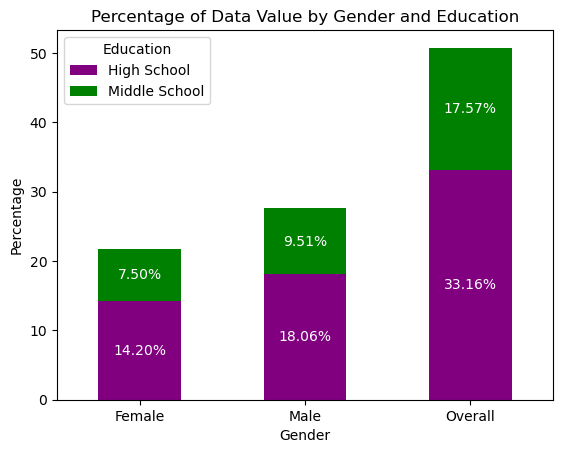

In [22]:
# The sum of 'Smokers_Sample' by gender and education
gender_education_data_sum = yts_ur.groupby(['Gender', 'Education'])['Smokers_Sample'].sum()

# The percentages by each gender and education
gender_education_percentage = (gender_education_data_sum / gender_education_data_sum.sum()) * 100

# Reshaping data
gender_education_percentage = gender_education_percentage.unstack()

ax = gender_education_percentage.plot(kind='bar', stacked=True, color=['purple', 'green'])
plt.title('Percentage of Data Value by Gender and Education')
plt.xlabel('Gender')
plt.ylabel('Percentage')
plt.xticks(rotation=0)
plt.legend(title='Education', loc='upper left')

for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy()
    ax.text(x + width / 2, y + height / 2, f'{height:.2f}%', ha='center', va='center', color='white')

plt.show()

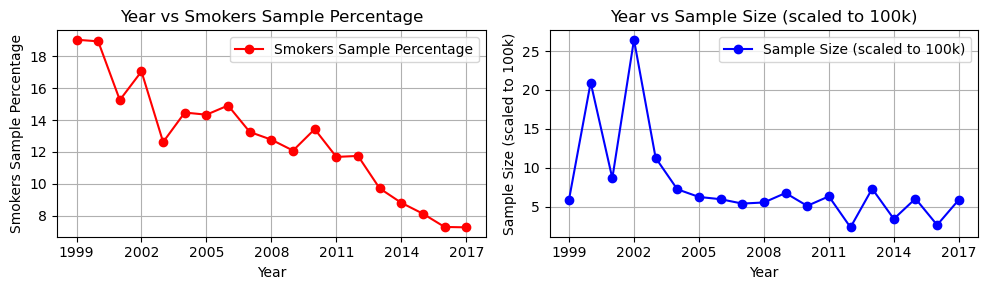

In [23]:
# Sort the DataFrame by 'Year'
yts_ur_sorted = yts_ur.sort_values(by='YEAR')

# Aggregate data by summing up 'Sample_Size' and 'Data_Value' for each year
summed_data = yts_ur_sorted.groupby('YEAR').agg({'Sample_Size': 'sum', 'Smokers_Sample': 'sum'}).reset_index()

# Retrieve the percentages
summed_data['Smokers_Sample_Percentage'] = (summed_data['Smokers_Sample']/summed_data['Sample_Size'])*100

fig, axs = plt.subplots(1, 2, figsize=(10, 3))

# Plotting 'Year' against 'Smokers_Sample_Percentage' on the first plot
axs[0].plot(summed_data['YEAR'], summed_data['Smokers_Sample_Percentage'], marker='o', label='Smokers Sample Percentage', color='red')
axs[0].set_title('Year vs Smokers Sample Percentage')
axs[0].set_xlabel('Year')
axs[0].set_ylabel('Smokers Sample Percentage')
axs[0].legend()
axs[0].grid(True)

# Plotting 'Year' against 'Sample_Size' scaled to 100,000 units on the second plot
axs[1].plot(summed_data['YEAR'], summed_data['Sample_Size'] / 100000, marker='o', label='Sample Size (scaled to 100k)', color='blue')
axs[1].set_title('Year vs Sample Size (scaled to 100k)')
axs[1].set_xlabel('Year')
axs[1].set_ylabel('Sample Size (scaled to 100k)')
axs[1].legend()
axs[1].grid(True)

axs[0].xaxis.set_major_locator(plt.MaxNLocator(integer=True))
axs[1].xaxis.set_major_locator(plt.MaxNLocator(integer=True))

axs[0].set_xticks(range(int(summed_data['YEAR'].min()), int(summed_data['YEAR'].max()) + 1, 3))
axs[1].set_xticks(range(int(summed_data['YEAR'].min()), int(summed_data['YEAR'].max()) + 1, 3))

plt.tight_layout()
plt.show()

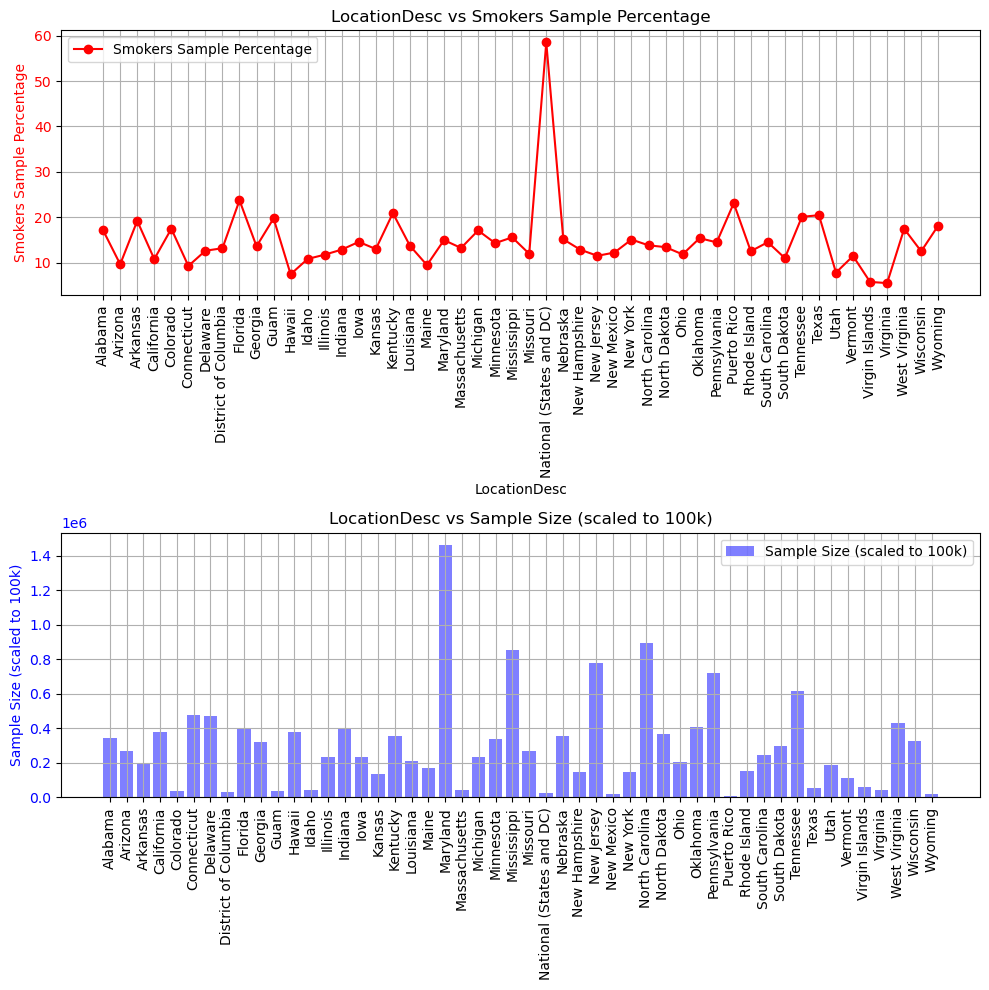

In [24]:
# Sort the DataFrame by 'LocationDesc'
yts_ur_sorted = yts_ur.sort_values(by='LocationDesc')

# Aggregate data by summing up 'Sample_Size' and 'Smokers_Sample' for each LocationDesc
summed_data = yts_ur_sorted.groupby('LocationDesc').agg({'Sample_Size': 'sum', 'Smokers_Sample': 'sum'}).reset_index()

# Retrieve Percentages
summed_data['Smokers_Sample_Percentage'] = (summed_data['Smokers_Sample']/summed_data['Sample_Size'])*100

fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Plot 'Smokers Sample' scaled to 100,000 units as a line plot
axs[0].plot(summed_data['LocationDesc'], summed_data['Smokers_Sample_Percentage'], 
            marker='o', label='Smokers Sample Percentage', color='red')
axs[0].set_xlabel('LocationDesc')
axs[0].set_ylabel('Smokers Sample Percentage', color='red')
axs[0].tick_params(axis='y', labelcolor='red')
axs[0].legend(loc='upper left')
axs[0].grid(True)

axs[0].set_xticks(summed_data.index)
axs[0].set_xticklabels(summed_data['LocationDesc'], rotation=90)

# Plot 'Sample Size' scaled to 100,000 units as a bar plot
axs[1].bar(summed_data['LocationDesc'], summed_data['Sample_Size'], 
           label='Sample Size (scaled to 100k)', color='blue', alpha=0.5)
axs[1].set_ylabel('Sample Size (scaled to 100k)', color='blue')
axs[1].tick_params(axis='y', labelcolor='blue')
axs[1].legend(loc='upper right')
axs[1].grid(True)

axs[1].set_xticks(summed_data.index)
axs[1].set_xticklabels(summed_data['LocationDesc'], rotation=90)

axs[0].set_title('LocationDesc vs Smokers Sample Percentage')
axs[1].set_title('LocationDesc vs Sample Size (scaled to 100k)')

plt.tight_layout()
plt.show()

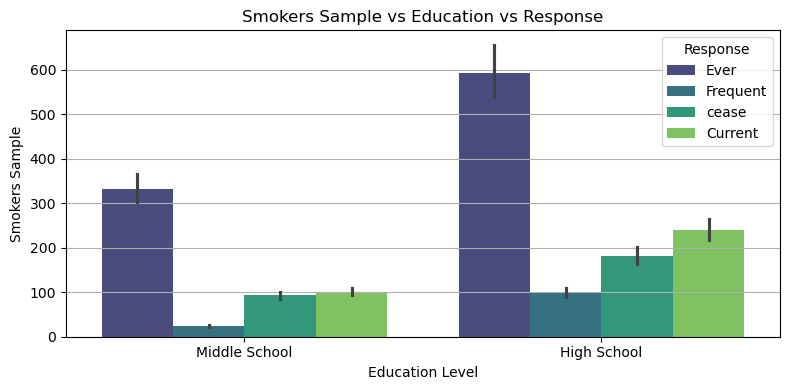

In [25]:
plt.figure(figsize=(8, 4))

sns.barplot(data=yts_ur, x='Education', y='Smokers_Sample', hue='Response', palette='viridis')

plt.title('Smokers Sample vs Education vs Response')
plt.xlabel('Education Level')
plt.ylabel('Smokers Sample')
plt.legend(title='Response')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [26]:
filtered_data = yts_ur[['YEAR', 'LocationDesc', 'Sample_Size']].copy()

# Splitting GeoLocation string to extract latitude and longitude
filtered_data[['Latitude', 'Longitude']] = yts_ur['GeoLocation'].str.strip('()').str.split(',', expand=True).astype(float)

grouped_data = filtered_data.groupby(['YEAR', 'LocationDesc']).mean().reset_index()

map = folium.Map(location=[filtered_data['Latitude'].iloc[0], filtered_data['Longitude'].iloc[0]], zoom_start=2)

def add_markers(year):
    map = folium.Map(location=[filtered_data['Latitude'].iloc[0], filtered_data['Longitude'].iloc[0]], zoom_start=4)
    year_data = grouped_data[grouped_data['YEAR'] == year]
    
    # Determine max and min sample sizes for color scaling
    max_sample_size = year_data['Sample_Size'].max()
    min_sample_size = year_data['Sample_Size'].min()
    
    # Create a colormap
    colormap = mcolors.LinearSegmentedColormap.from_list('my_colormap', ['#f54242', '#8B0000'])
    
    for index, row in year_data.iterrows():
        # Scale radius based on sample size
        radius = row['Sample_Size'] / 100 
        
        # Determine fill color based on sample size
        sample_size_normalized = (row['Sample_Size'] - min_sample_size) / (max_sample_size - min_sample_size)
        fill_color = mcolors.rgb2hex(colormap(sample_size_normalized))
        
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=radius,
            popup=f"{row['LocationDesc']} ({year}): {row['Sample_Size']}",
            fill=True,
            color='black',
            fill_color=fill_color
        ).add_to(map)
    display(map)

interact(add_markers, year=grouped_data['YEAR'].unique().tolist())
map.save('smoking_trends_map.html')

interactive(children=(Dropdown(description='year', options=(1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 20…

## Machine Learning Models

### K-Mediods Unsupervised Clustering

In [27]:
# Selecting relevant columns
columns_to_fit = [
    'YEAR', 'TopicDesc', 'MeasureDesc', 'Response', 'Data_Value',
    'Data_Value_Std_Err','Sample_Size', 'Gender', 'Education', 'Confidence_Interval_Width', 'Smokers_Sample', 'Region'
]

selected_df = yts_ur[columns_to_fit]
selected_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10076 entries, 0 to 10599
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   YEAR                       10076 non-null  int64  
 1   TopicDesc                  10076 non-null  object 
 2   MeasureDesc                10076 non-null  object 
 3   Response                   10076 non-null  object 
 4   Data_Value                 10076 non-null  float64
 5   Data_Value_Std_Err         10076 non-null  float64
 6   Sample_Size                10076 non-null  float64
 7   Gender                     10076 non-null  object 
 8   Education                  10076 non-null  object 
 9   Confidence_Interval_Width  10076 non-null  float64
 10  Smokers_Sample             10076 non-null  float64
 11  Region                     10076 non-null  object 
dtypes: float64(5), int64(1), object(6)
memory usage: 1023.3+ KB


**Data Transformation**

In [28]:
# Encode categorical variables
encoder = LabelEncoder()
categorical_cols = ['MeasureDesc', 'Response', 'Gender', 'Education', 'TopicDesc', 'Region']
for col in categorical_cols:
    selected_df.loc[:, col] = encoder.fit_transform(selected_df.loc[:, col])

# Scale numerical variables
scaler = StandardScaler()
numerical_cols = ['YEAR', 'Data_Value', 'Data_Value_Std_Err', 'Sample_Size', 'Confidence_Interval_Width', 'Smokers_Sample']
selected_df.loc[:, numerical_cols] = scaler.fit_transform(selected_df.loc[:, numerical_cols])

# Normalize the data to unit norm across features
selected_df = pd.DataFrame(normalize(selected_df, axis=0), columns=selected_df.columns)

selected_df.head()

,YEAR,TopicDesc,MeasureDesc,Response,Data_Value,Data_Value_Std_Err,Sample_Size,Gender,Education,Confidence_Interval_Width,Smokers_Sample,Region
0,-0.005274,0.006997,0.012879,0.005712,0.005596,0.007561,-0.000486,0.015248,0.013929,0.007800,0.004320,0.000000
1,0.002082,0.006997,0.012879,0.005712,0.012943,0.005879,-0.003775,0.000000,0.000000,0.005943,0.001890,0.013221
2,0.014955,0.013994,0.008586,0.011424,-0.003588,0.000275,-0.003197,0.007624,0.000000,0.000229,-0.002076,0.013221
3,-0.003435,0.006997,0.012879,0.005712,0.003853,0.001956,-0.000732,0.015248,0.013929,0.001943,0.003087,0.000000
4,-0.003435,0.013994,0.008586,0.005712,0.000085,0.002517,-0.002324,0.007624,0.000000,0.002657,-0.000213,0.004407


**Dimentinality Reduction Using Princple Component Analysis (PCA)**

In [29]:
pca = PCA(n_components=2)
selected_df_pca = pca.fit_transform(selected_df)

**Finding Best K Value using inertias and silhouette scores**

<Figure size 800x400 with 0 Axes>

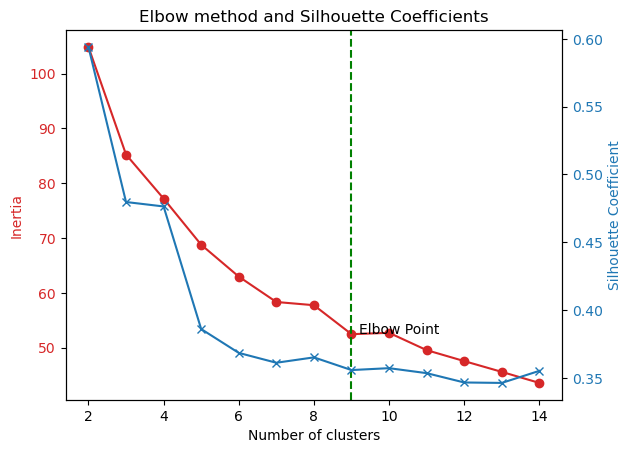

In [30]:
inertias = []
silhouette_coefficients = []
for i in range(2, 15):
    km_pca = KMedoids(n_clusters=i, init="k-medoids++", max_iter=500)
    km_pca.fit(selected_df_pca)
    inertias.append(km_pca.inertia_) 
    silhouette_coefficients.append(silhouette_score(selected_df_pca, km_pca.labels_))

plt.figure(figsize=(8, 4))
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Number of clusters')
ax1.set_ylabel('Inertia', color=color)
ax1.plot(range(2, 15), inertias, marker='o', color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  
color = 'tab:blue'
ax2.set_ylabel('Silhouette Coefficient', color=color)
ax2.plot(range(2, 15), silhouette_coefficients, marker='x', color=color)
ax2.tick_params(axis='y', labelcolor=color)

kl = KneeLocator(range(2, 15), inertias, curve="convex", direction="decreasing")
ax1.axvline(x=kl.elbow, color='green', linestyle='--', label='Knee Point')
ax1.annotate('Elbow Point', xy=(kl.elbow, inertias[kl.elbow - 2]), xytext=(kl.elbow+0.2, inertias[kl.elbow - 2]))

plt.title('Elbow method and Silhouette Coefficients')
plt.show()

**Using 5 as value 'K' for clustering based on optimal inertia and Silhouette Score**

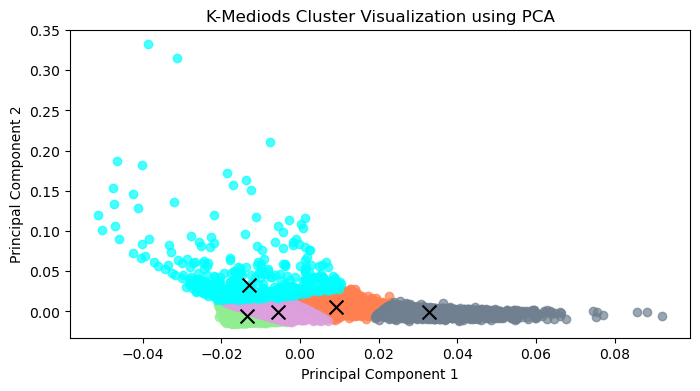

In [31]:
# Fit KMeans model with the optimal number of clusters
km_pca = KMedoids(n_clusters=5, method = 'pam', init="k-medoids++", max_iter=500)
km_pca.fit(selected_df_pca)

cluster_labels = km_pca.labels_

custom_colors = ['lightgreen', 'coral', 'plum', 'cyan', 'slategrey']
plt.figure(figsize=(8, 4))

for cluster_label in range(5):
    plt.scatter(selected_df_pca[cluster_labels == cluster_label, 0], 
                selected_df_pca[cluster_labels == cluster_label, 1], 
                label=f'Cluster {cluster_label}', alpha=0.7, c=custom_colors[cluster_label])

plt.scatter(km_pca.cluster_centers_[:, 0], km_pca.cluster_centers_[:, 1], c='black', marker='x', s=100)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-Mediods Cluster Visualization using PCA')
plt.show()

**Clusters visualization**

In [32]:
df = yts_ur[columns_to_fit].copy() 
df['Cluster'] = cluster_labels

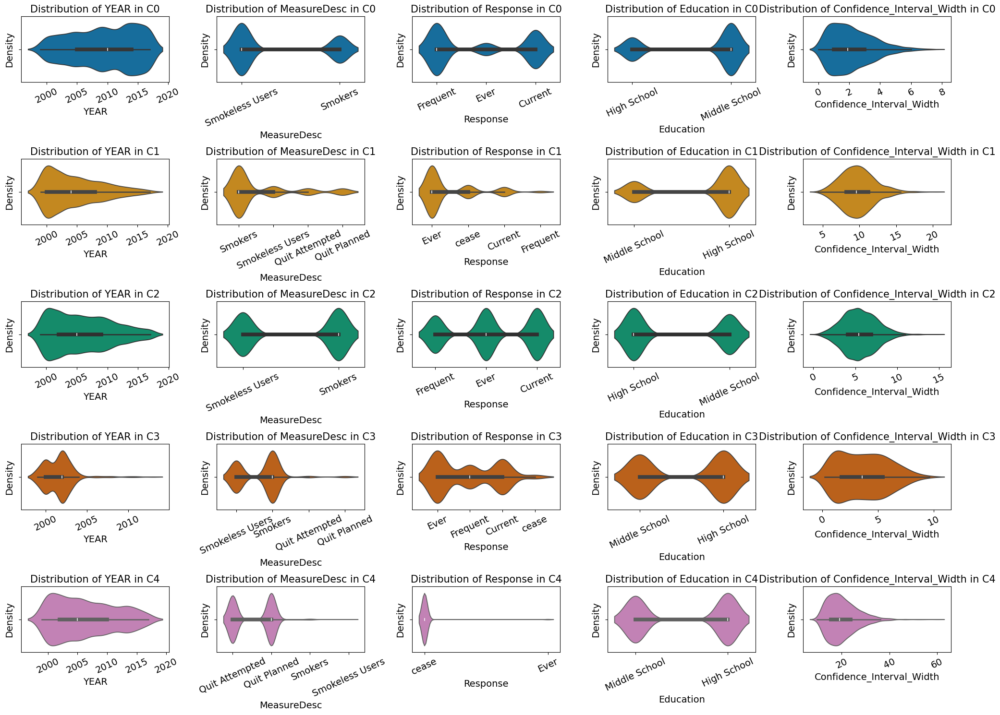

In [33]:
image_file_path = "cluster_plots_pca.png"

columns_to_fit = [
    'YEAR', 'MeasureDesc', 'Response', 'Education', 'Confidence_Interval_Width'
]

num_clusters = df['Cluster'].nunique()
num_features = len(columns_to_fit)

palette = sns.color_palette("colorblind", num_clusters)
fig, axes = plt.subplots(num_clusters, num_features, figsize=(4*num_features, 3*num_clusters))
axes = axes.flatten()

# Iterate over clusters and features and create violin plots for each feature within each cluster
for cluster_label in range(num_clusters):
    cluster_data = df[df['Cluster'] == cluster_label]
    for i, (col, ax) in enumerate(zip(columns_to_fit, axes[cluster_label*num_features:(cluster_label+1)*num_features])):
        sns.violinplot(x=col, data=cluster_data, ax=ax, palette=[palette[cluster_label]], hue=cluster_label, legend=False)
        ax.set_title(f'Distribution of {col} in C{cluster_label}', fontsize=15)
        ax.set_xlabel(col, fontsize=14)
        ax.set_ylabel('Density', fontsize=14)
        ax.tick_params(axis='x', labelsize=14, rotation = 25)  
        ax.tick_params(axis='y', labelsize=14) 

plt.tight_layout()
plt.savefig(image_file_path)
plt.show()

**Dimentinality Reduction Using t-distributed Stochastic Neighbor Embedding t-SNE**

In [34]:
tsne = TSNE(n_components=2, random_state=42)
selected_df_tsne = tsne.fit_transform(selected_df)

**Finding Best K Value using inertias and silhouette scores**

<Figure size 800x400 with 0 Axes>

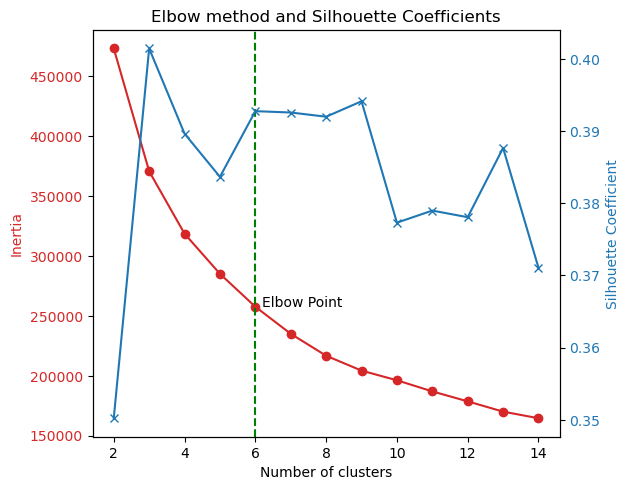

In [35]:
inertias = []
silhouette_coefficients = []
for i in range(2, 15):
    km_tsne = KMedoids(n_clusters=i, init="k-medoids++", max_iter=500)
    km_tsne.fit(selected_df_tsne)  # Use the transformed data here
    inertias.append(km_tsne.inertia_) 
    silhouette_coefficients.append(silhouette_score(selected_df_tsne, km_tsne.labels_))

plt.figure(figsize=(8, 4))
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Number of clusters')
ax1.set_ylabel('Inertia', color=color)
ax1.plot(range(2, 15), inertias, marker='o', color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  
color = 'tab:blue'
ax2.set_ylabel('Silhouette Coefficient', color=color)
ax2.plot(range(2, 15), silhouette_coefficients, marker='x', color=color)
ax2.tick_params(axis='y', labelcolor=color)

kl = KneeLocator(range(2, 15), inertias, curve="convex", direction="decreasing")
ax1.axvline(x=kl.elbow, color='green', linestyle='--', label='Knee Point')
ax1.annotate('Elbow Point', xy=(kl.elbow, inertias[kl.elbow - 2]), xytext=(kl.elbow+0.2, inertias[kl.elbow - 2]))

fig.tight_layout()  
plt.title('Elbow method and Silhouette Coefficients')
plt.show()

*Using elbow point for clustering*

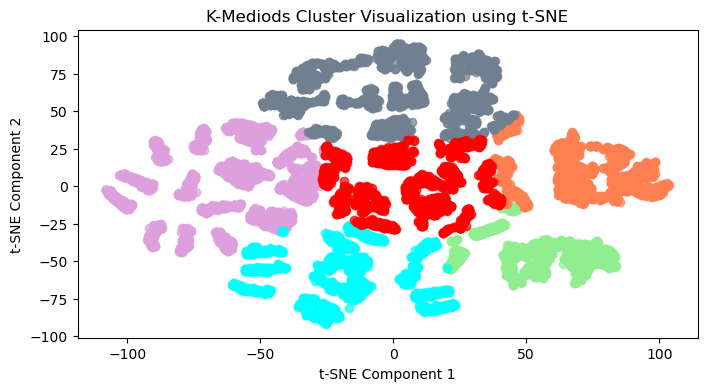

In [36]:
km_tnse =  KMedoids(n_clusters=kl.elbow, method = 'pam', init="k-medoids++", max_iter=500)
km_tnse.fit(selected_df_tsne)

cluster_labels = km_tnse.labels_

custom_colors = ['lightgreen', 'coral', 'plum', 'cyan', 'slategrey', 'red']
plt.figure(figsize=(8, 4))
for cluster_label in range(kl.elbow):
    plt.scatter(selected_df_tsne[cluster_labels == cluster_label, 0], 
                selected_df_tsne[cluster_labels == cluster_label, 1], 
                alpha=0.7, c=custom_colors[cluster_label])


plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('K-Mediods Cluster Visualization using t-SNE')
plt.show()

**Clusters visualization**

In [37]:
df = yts_ur[columns_to_fit].copy() 
df['Cluster'] = cluster_labels

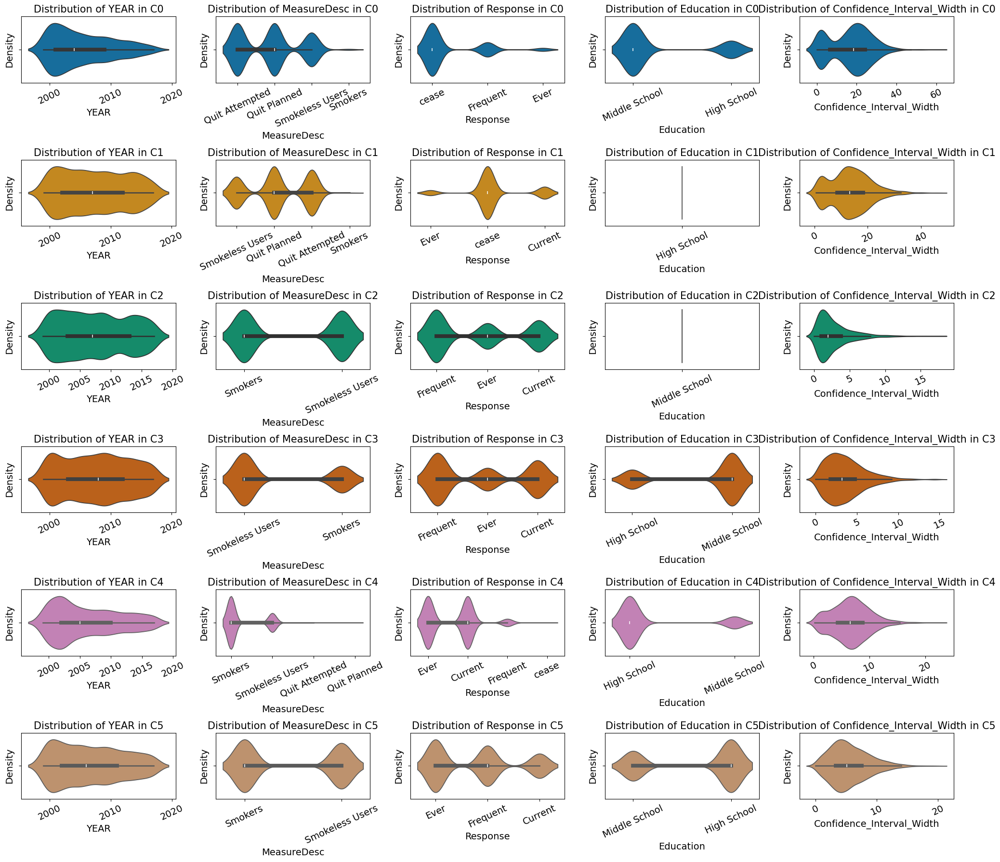

In [38]:
image_file_path = "cluster_plots_pca.png"

columns_to_fit = [
    'YEAR', 'MeasureDesc', 'Response', 'Education', 'Confidence_Interval_Width'
]

num_clusters = df['Cluster'].nunique()
num_features = len(columns_to_fit)

palette = sns.color_palette("colorblind", num_clusters)
fig, axes = plt.subplots(num_clusters, num_features, figsize=(4*num_features, 3*num_clusters))
axes = axes.flatten()

# Iterate over clusters and features and create violin plots for each feature within each cluster
for cluster_label in range(num_clusters):
    cluster_data = df[df['Cluster'] == cluster_label]
    for i, (col, ax) in enumerate(zip(columns_to_fit, axes[cluster_label*num_features:(cluster_label+1)*num_features])):
        sns.violinplot(x=col, data=cluster_data, ax=ax, palette=[palette[cluster_label]], hue=cluster_label, legend=False)
        ax.set_title(f'Distribution of {col} in C{cluster_label}', fontsize=15)
        ax.set_xlabel(col, fontsize=14)
        ax.set_ylabel('Density', fontsize=14)
        ax.tick_params(axis='x', labelsize=14, rotation = 25)  # Rotate x-axis labels and adjust font size
        ax.tick_params(axis='y', labelsize=14)  # Adjust y-axis font size

plt.tight_layout()
plt.savefig(image_file_path)
plt.show()

### Association Rule Mining

In [39]:
selected_df = yts_ur.drop(['LocationAbbr','Data_Value_Std_Err', 'Low_Confidence_Limit', 'Data_Value',
                           'High_Confidence_Limit', 'Sample_Size', 'GeoLocation', 'Confidence_Interval_Width',
                           'Smokers_Sample', 'Region'], axis = 1)

In [40]:
yts_dummies = pd.get_dummies(selected_df)
yts_dummies.head()

,YEAR,LocationDesc_Alabama,LocationDesc_Arizona,LocationDesc_Arkansas,LocationDesc_California,LocationDesc_Colorado,LocationDesc_Connecticut,LocationDesc_Delaware,LocationDesc_District of Columbia,LocationDesc_Florida,...,MeasureDesc_Smokers,Response_Current,Response_Ever,Response_Frequent,Response_cease,Gender_Female,Gender_Male,Gender_Overall,Education_High School,Education_Middle School
0,2004,False,False,False,False,False,False,False,False,False,...,True,False,True,False,False,False,False,True,False,True
1,2008,True,False,False,False,False,False,False,False,False,...,True,False,True,False,False,True,False,False,True,False
2,2015,False,False,False,False,False,False,False,False,False,...,False,False,False,True,False,False,True,False,True,False
3,2005,False,False,False,False,False,False,False,False,False,...,True,False,True,False,False,False,False,True,False,True
4,2005,False,False,False,False,False,True,False,False,False,...,False,False,True,False,False,False,True,False,True,False


In [41]:
# Create dummy variables for the "YEAR" attribute
year_dummies = pd.get_dummies(yts_dummies['YEAR'], prefix='YEAR')

# Concatenate the dummy variables with the original dataframe
yts_dummies = pd.concat([yts_dummies, year_dummies], axis=1)

# Drop the original "YEAR" column
yts_dummies.drop(['YEAR'], axis=1, inplace=True)

yts_dummies

,LocationDesc_Alabama,LocationDesc_Arizona,LocationDesc_Arkansas,LocationDesc_California,LocationDesc_Colorado,LocationDesc_Connecticut,LocationDesc_Delaware,LocationDesc_District of Columbia,LocationDesc_Florida,LocationDesc_Georgia,...,YEAR_2008,YEAR_2009,YEAR_2010,YEAR_2011,YEAR_2012,YEAR_2013,YEAR_2014,YEAR_2015,YEAR_2016,YEAR_2017
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,True,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10594,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
10595,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
10596,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
10598,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False


In [42]:
frequent_itemsets = apriori(yts_dummies, min_support=0.01, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1.0)
rules_sorted = rules.sort_values(by='lift', ascending=False)

rules_sorted.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
2867,"(Response_cease, Education_Middle School)","(TopicDesc_Cessation, YEAR_2000)",0.081282,0.028186,0.014589,0.179487,6.368003,0.012298,1.184399,0.917545
2864,"(TopicDesc_Cessation, Education_Middle School)","(YEAR_2000, Response_cease)",0.081282,0.028186,0.014589,0.179487,6.368003,0.012298,1.184399,0.917545
2865,"(YEAR_2000, Response_cease)","(TopicDesc_Cessation, Education_Middle School)",0.028186,0.081282,0.014589,0.517606,6.368003,0.012298,1.904495,0.867414
2862,"(TopicDesc_Cessation, YEAR_2000)","(Response_cease, Education_Middle School)",0.028186,0.081282,0.014589,0.517606,6.368003,0.012298,1.904495,0.867414
5356,"(TopicDesc_Cessation, Gender_Overall)","(MeasureDesc_Quit Planned, Response_cease, Edu...",0.074137,0.040592,0.018956,0.255689,6.299087,0.015947,1.288989,0.908608


**Rules Visualization**

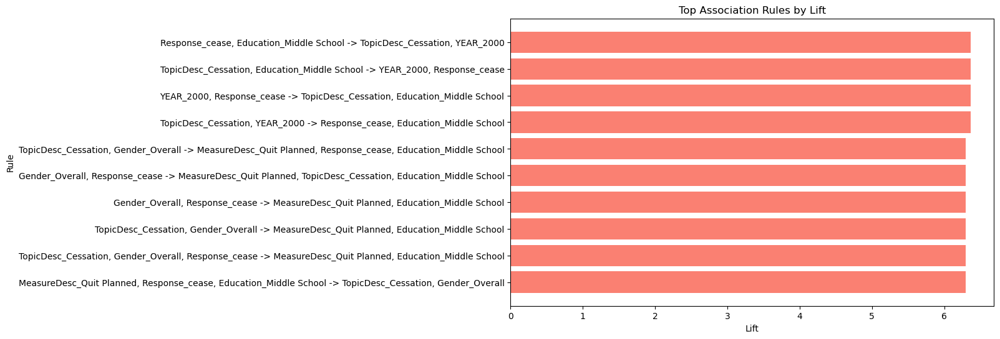

In [43]:
# Combine antecedents and consequents for each rule
rules_sorted['rule'] = rules_sorted['antecedents'].apply(lambda x: ', '.join(list(x))) + ' -> ' + rules_sorted['consequents'].apply(lambda x: ', '.join(list(x)))

plt.figure(figsize=(10, 6))
plt.barh(rules_sorted['rule'].head(10), rules_sorted['lift'].head(10), color='salmon')
plt.xlabel('Lift')
plt.ylabel('Rule')
plt.title('Top Association Rules by Lift')
plt.gca().invert_yaxis()  # Invert y-axis to show highest lift at the top
plt.show()

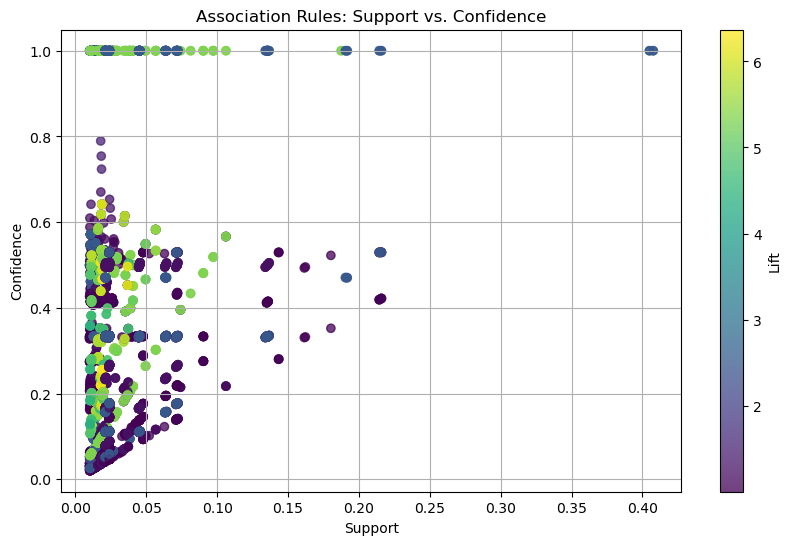

In [44]:
plt.figure(figsize=(10, 6))
scatter = plt.scatter(rules['support'], rules['confidence'], c=rules['lift'], cmap='viridis', alpha=0.75)
plt.xlabel('Support')
plt.ylabel('Confidence')
plt.title('Association Rules: Support vs. Confidence')
colorbar = plt.colorbar(scatter, label='Lift')
plt.grid(True)
plt.show()

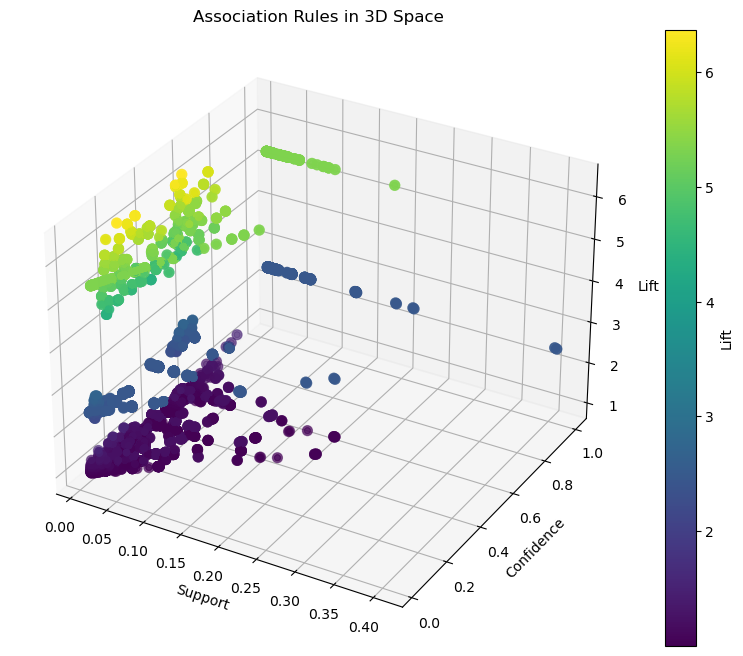

In [45]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(rules['support'], rules['confidence'], rules['lift'], c=rules['lift'], cmap='viridis', s=50, alpha=0.6)

ax.set_xlabel('Support')
ax.set_ylabel('Confidence')
ax.set_zlabel('Lift')
ax.set_title('Association Rules in 3D Space')

cbar = plt.colorbar(ax.scatter(rules['support'], rules['confidence'], rules['lift'], c=rules['lift'], cmap='viridis'))
cbar.set_label('Lift')
plt.show()

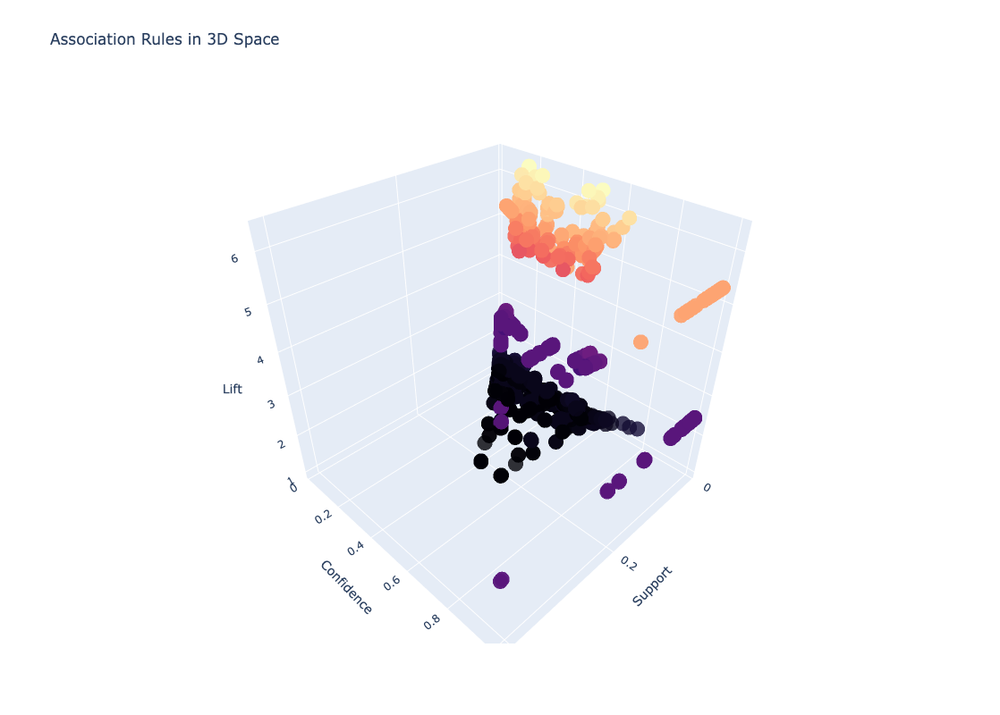

In [46]:
# Create hover text for each data point
hover_text = []
for index, row in rules.iterrows():
    rule_text = f"Antecedent: {row['antecedents']}<br>"
    rule_text += f"Consequent: {row['consequents']}<br>"
    rule_text += f"Support: {row['support']:.4f}<br>"
    rule_text += f"Confidence: {row['confidence']:.4f}<br>"
    rule_text += f"Lift: {row['lift']:.4f}<br>"
    hover_text.append(rule_text)

# Create data for the 3D scatter plot with hover text
scatter_data = go.Scatter3d(
    x=rules['support'],
    y=rules['confidence'],
    z=rules['lift'],
    mode='markers',
    marker=dict(
        size=10,
        color=rules['lift'],
        colorscale='Magma',
        opacity=0.8
    ),
    hovertext=hover_text
)

layout = go.Layout(
    title='Association Rules in 3D Space',
    scene=dict(
        xaxis=dict(title='Support'),
        yaxis=dict(title='Confidence'),
        zaxis=dict(title='Lift')
    )
)

fig = go.Figure(data=[scatter_data], layout=layout)
fig.update_layout(width=800, height=800)
fig.show()

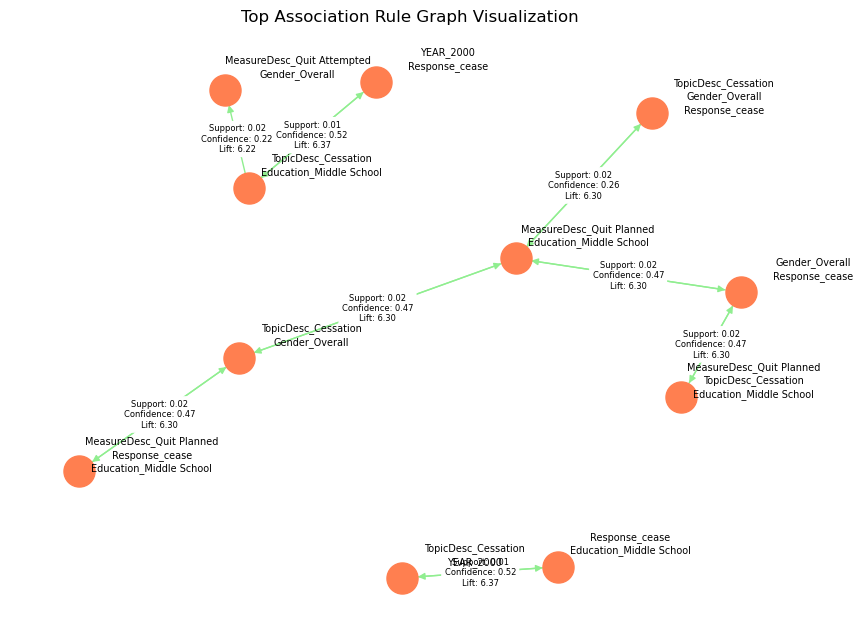

In [108]:
# Sort the rules by lift (or any other metric)
top_rules = rules.sort_values(by='lift', ascending=False).head(15) 

# Create a directed graph
G = nx.DiGraph()

# Add nodes for antecedents and consequents
for i, rule in top_rules.iterrows():
    antecedent = ", ".join(rule['antecedents'])
    consequent = ", ".join(rule['consequents'])
    G.add_node(antecedent)
    G.add_node(consequent)
    G.add_edge(antecedent, consequent, 
               label=f"Support: {rule['support']:.2f}\nConfidence: {rule['confidence']:.2f}\nLift: {rule['lift']:.2f}")

plt.figure(figsize=(8, 6))

pos = nx.spring_layout(G, k=1.1)

nx.draw(G, pos, with_labels=False, node_size=500, node_color='coral', edge_color='lightgreen', arrowsize=10)
edge_labels = nx.get_edge_attributes(G, 'label')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=6, label_pos=0.5, rotate=False)

node_label_pos = {k: (v[0]+0.2, v[1]+0.1) for k, v in pos.items()}
for node, (x, y) in node_label_pos.items():
    label = node.split(', ')
    nx.draw_networkx_labels(G, {node: (x, y)}, labels={node: ''})
    for i, line in enumerate(label):
        plt.text(x, y - i * 0.05, line, ha='center', fontsize=7)
plt.title('Top Association Rule Graph Visualization')
plt.show()


# TIMESERIES FORECASTING

In [7]:
# Filter for relevant columns
filtered_data = yts[['YEAR', 'Data_Value', 'TopicDesc']].dropna(subset=['Data_Value'])

cigarette_data = filtered_data[filtered_data['TopicDesc'] == "Cigarette Use (Youth)"]

# Aggregate data by year (mean value)
annual_trends = cigarette_data.groupby('YEAR')['Data_Value'].mean().reset_index()

print(annual_trends.head())

   YEAR  Data_Value
0  1999   28.512766
1  2000   26.249891
2  2001   21.499383
3  2002   23.019121
4  2003   18.501058


In [8]:
annual_trends['YEAR'] = pd.to_datetime(annual_trends['YEAR'], format='%Y')
annual_trends.set_index('YEAR', inplace=True)

In [9]:

def check_stationarity(data):
    result = adfuller(data)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    if result[1] > 0.05:
        print("The time series is likely non-stationary.")
    else:
        print("The time series is likely stationary.")

check_stationarity(annual_trends['Data_Value'])


ADF Statistic: 3.201940
p-value: 1.000000
Critical Values:
	1%: -4.223
	5%: -3.189
	10%: -2.730
The time series is likely non-stationary.


In [10]:
# Apply first differencing
annual_trends['Differenced_Data'] = annual_trends['Data_Value'].diff()

# Drop any NaN that came about as a result of differencing
annual_trends.dropna(inplace=True)

# Check stationarity again
check_stationarity(annual_trends['Differenced_Data'])


ADF Statistic: -5.612105
p-value: 0.000001
Critical Values:
	1%: -3.889
	5%: -3.054
	10%: -2.667
The time series is likely stationary.


In [11]:
# Trying different combinations of p, d, q
combinations = [(p, d, q) for p in range(3) for d in range(3) for q in range(3)]
results = []

for combo in combinations:
    try:
        model = ARIMA(annual_trends['Data_Value'], order=combo)
        fitted_model = model.fit()
        results.append((combo, fitted_model.aic))
    except Exception as e:
        results.append((combo, None))

# Sorting results by AIC to find the best model
results.sort(key=lambda x: (x[1] is not None, x[1]))  # sort by AIC, ignoring models that failed to fit

# Displaying the best combinations
best_combinations = pd.DataFrame(results, columns=['(p, d, q)', 'AIC'])
best_combinations.dropna()  # removing combinations where the model failed to converge


C:\Users\nalla\anaconda3\envs\ML\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)
C:\Users\nalla\anaconda3\envs\ML\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)
C:\Users\nalla\anaconda3\envs\ML\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)
C:\Users\nalla\anaconda3\envs\ML\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)
C:\Users\nalla\anaconda3\envs\ML\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

,"(p, d, q)",AIC
0,"(1, 2, 1)",66.961043
1,"(1, 2, 2)",67.739329
2,"(1, 2, 0)",68.204274
3,"(2, 2, 1)",68.213858
4,"(0, 2, 2)",68.424015
5,"(0, 2, 1)",69.594560
6,"(2, 2, 2)",69.711474
7,"(2, 2, 0)",69.892278
8,"(2, 1, 0)",71.306140
9,"(1, 1, 2)",72.334600


In [17]:
# Fitting the ARIMA(0, 2, 1) model
model = ARIMA(annual_trends['Data_Value'], order=(1, 2, 1))
fitted_model = model.fit()

# Printing the summary of the fitted model
print(fitted_model.summary())


                               SARIMAX Results                                
Dep. Variable:             Data_Value   No. Observations:                   18
Model:                 ARIMA(1, 2, 1)   Log Likelihood                 -30.481
Date:                Sun, 05 May 2024   AIC                             66.961
Time:                        20:51:12   BIC                             69.279
Sample:                    01-01-2000   HQIC                            67.080
                         - 01-01-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5964      0.191     -3.122      0.002      -0.971      -0.222
ma.L1         -0.9985     35.005     -0.029      0.977     -69.607      67.610
sigma2         2.0420     71.236      0.029      0.9

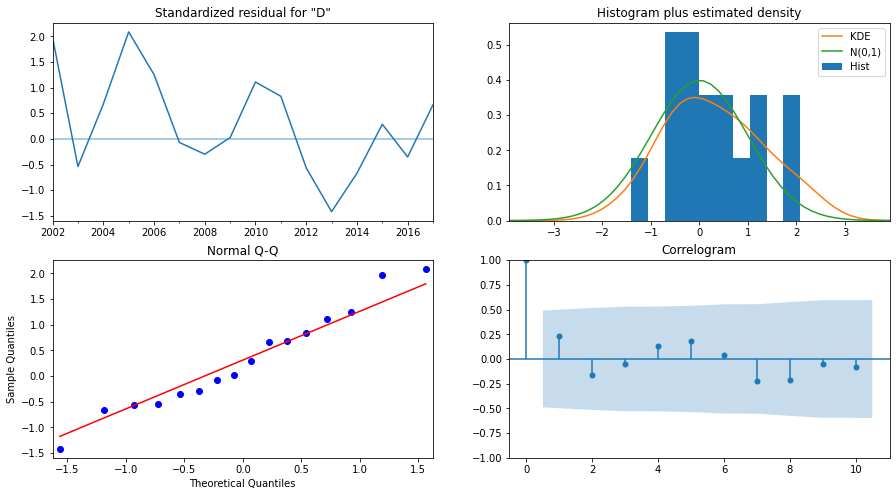

In [20]:
# Plotting diagnostic plots to check for any unusual behavior
fitted_model.plot_diagnostics(figsize=(15, 8))
plt.show()

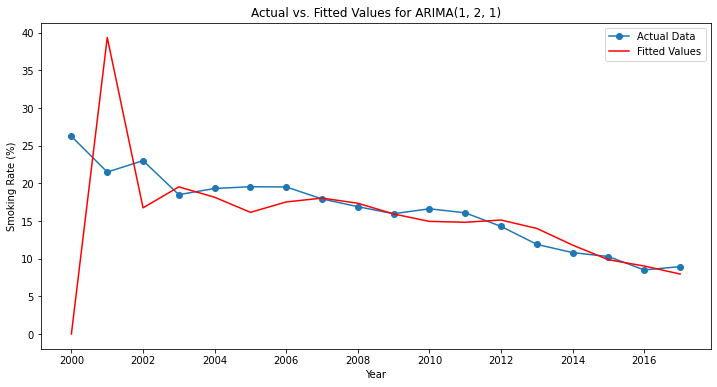

In [19]:
# Plotting the historical data and the fitted values
plt.figure(figsize=(12, 6))
plt.plot(annual_trends.index, annual_trends['Data_Value'], label='Actual Data', marker='o')
plt.plot(annual_trends.index, fitted_model.fittedvalues, label='Fitted Values', color='red')
plt.title('Actual vs. Fitted Values for ARIMA(1, 2, 1)')
plt.xlabel('Year')
plt.ylabel('Smoking Rate (%)')
plt.legend()
plt.show()

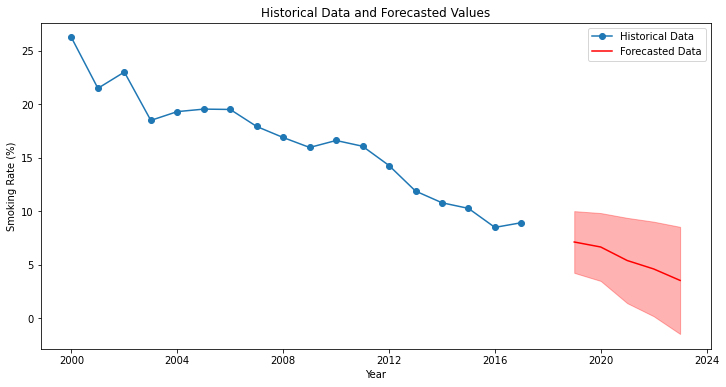

In [21]:
# Forecasting the next 5 years
forecast_period = 5
forecast_result = fitted_model.get_forecast(steps=forecast_period)
forecast_mean = forecast_result.predicted_mean
forecast_conf_int = forecast_result.conf_int()

# Plotting the historical data and the forecasts
plt.figure(figsize=(12, 6))
plt.plot(annual_trends.index, annual_trends['Data_Value'], label='Historical Data', marker='o')
plt.plot(pd.date_range(start=annual_trends.index[-1], periods=forecast_period + 1, freq='A')[1:], forecast_mean, label='Forecasted Data', color='red')
plt.fill_between(pd.date_range(start=annual_trends.index[-1], periods=forecast_period + 1, freq='A')[1:], forecast_conf_int.iloc[:, 0], forecast_conf_int.iloc[:, 1], color='red', alpha=0.3)
plt.title('Historical Data and Forecasted Values')
plt.xlabel('Year')
plt.ylabel('Smoking Rate (%)')
plt.legend()
plt.show()

In [22]:
#Split the data into training and testing
train = annual_trends['Data_Value'][:-5] 
test = annual_trends['Data_Value'][-5:]  

In [23]:
#Fit the ARIMA model on the training data
model = ARIMA(train, order=(1, 2, 1))
fitted_model = model.fit()

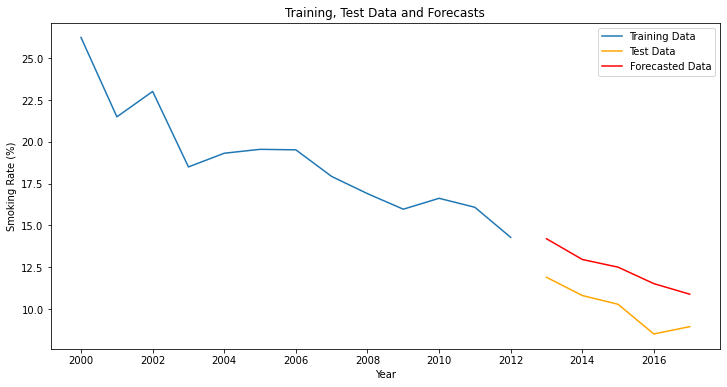

In [24]:
#Forecast the next 5 years
forecast = fitted_model.get_forecast(steps=5)
forecast_values = forecast.predicted_mean


# Plotting the results
plt.figure(figsize=(12, 6))
plt.plot(train.index, train, label='Training Data')
plt.plot(test.index, test, label='Test Data', color='orange')
plt.plot(test.index, forecast_values, label='Forecasted Data', color='red')
plt.title('Training, Test Data and Forecasts')
plt.xlabel('Year')
plt.ylabel('Smoking Rate (%)')
plt.legend()
plt.show()